In [167]:
%run -i "../Retropy_framework.py"

iPy: True


https://www.bdcinvestor.com/bdc-etfs
http://etfdb.com/compare/dividend-yield/

In [186]:
#agg_idx = name(get("LEGATRUU;IND@B", interpolate=True), "~AGGG")
aggg_idx = "LEGATRUU;IND@B"

priv_equity_all = [PEX, PSP] # also: LSE:IPRV
priv_equity = [PSP]
biz_dev_all = [BIZD, BDCS, BDCL, BDCZ, BUY]
biz_dev = [BDCS, BDCL]
mort = [MORL, REML, REM]
alts = [ALTY]
corp_bonds = [cjb, ANGL]
reg_bonds = [gb, AGG, EDV]
div_stocks = [SDIV, DIV, DVY, SMHD]
mlp = [AMZA, AMJL, YMLP, MLPQ, ZMLP]
other = [FPE, YYY, CEFL]
call_put = [QYLD] # limited upside, unlimited downside.

base = [QQQ, QLD, SPY, SSO, VXUS, ]

Fetching QLD from AV .. DONE


In [187]:
all = get(priv_equity + biz_dev + mort + alts + corp_bonds + reg_bonds + div_stocks + mlp + call_put + other + base)

In [188]:
def show_cum_income(*all):
    income = lmap(lambda x: get_income(x, smooth=0), all)
    income = [x.cumsum() for x in income]
    show(income, ta=False, log=False, legend=False, title="net income")

def analyze_assets(*all, start=None, despike=True):
    all = get(all, start=start, despike=despike) # note we don't trim
    
    bases = [ mix(lc, gb, do_get=False), mix(i_ac, gb, do_get=False), mix(lc, aggg_idx, do_get=False), mix(i_ac, aggg_idx, do_get=False)]
    lst = get(all + bases, mode="TR", reget=True)
    show_risk_return(*lst, title="TR Risk-Return")
    lst = get(all + bases, mode="NTR", reget=True)
    show_risk_return(*lst, title="NTR Risk-Return")
    lst = get(all + bases, mode="PR", reget=True)
    show_risk_return(*lst, title="PR Risk-Return")
    show_risk_return_modes(*all)
    
    show_risk_return_modes(*all, ret_func=get_curr_yield, modes=['TR'], title='Risk-Yield TR')
    show_risk_return_modes(*all, ret_func=get_curr_yield, modes=['NTR'], title='Risk-Yield NTR')
    show_risk_yield(*all)
    
    show_cum_income(*all)
    show_cum_income(*get(all, trim=True))
    
    show(lmap(adj_inf, lmap(price, all)), 1, title="real price")

    income = lmap(get_income, all)
    show(income, income[0].mean(), 0, ta=False, log=False, title="net income")

    show(lmap(roi, all), ta=False, log=False, title="net ROI")

    yields = lmap(get_real_yield, all)
    yields[0] = ma(yields[0], 8).dropna()
    show(yields, 0, ta=False, log=False, title="real gross yield")

    yields = lmap(getYield, all)
    yields[0] = ma(yields[0], 8).dropna()
    show(yields, get_inflation(365*7)[getCommonDate(yields, agg=min):], 0, ta=False, log=False, title="nominal gross yield")    
    
    lrret_mutual(all)
    
#show_cum_income(*all)


dropped: ALTY, SMHD, MLPQ, REML, AMJL
trimmed data from 1990-01-02 [VFINX] to 1995-01-03 [VFITX]
trimmed data from 1995-01-03 [VFITX] to 1996-04-29 [VGTSX]
trimmed data from 1990-01-02 [VFINX] to 2013-08-23 [LEGATRUU;IND@B]
trimmed data from 1996-04-29 [VGTSX] to 2013-08-23 [LEGATRUU;IND@B]
trimmed data from 1990-01-02 [VFINX=lc] to 1995-01-03 [VFITX=gb, <noname>, +10 more]
trimmed data from 1995-01-03 [VFITX=gb] to 1996-04-29 [<noname>, <noname>, +10 more]
trimmed data from 1990-01-02 [VFINX=lc] to 2013-08-23 [LEGATRUU;IND@B=LEGATRUU;IND@B, <noname>, +10 more]
trimmed data from 1996-04-29 [VGTSX=i_ac] to 2013-08-23 [LEGATRUU;IND@B=LEGATRUU;IND@B, <noname>, +10 more]
trimmed data from 1995-01-03 [VWEHX = cjb, VFITX = gb, +14 more] to 2014-10-02 [AMZA]


trimmed data from 1995-01-03 [VWEHX = cjb, VFITX = gb, +3 more] to 2014-10-02 [AMZA]



Cross:
PSP: VXUS:59.9|QLD:16.8|FPE:12.4|BDCL:7.4|cjb:3.3|AMZA:0.2   R^2: 0.908
BDCS: BDCL:48.3|gb:9.8|DVY:7.0|QYLD:2.1|FPE:0.6|ANGL:0.3   R^2: 0.995
BDCL: BDCS:70.1|MORL:29.9   R^2: 0.867
MORL: BDCL:42.6|QLD:39.9|CEFL:17.5   R^2: 0.820
REM: MORL:44.8|QYLD:10.6|gb:10.3|FPE:5.4|BDCS:3.4|DVY:2.4   R^2: 0.997
cjb: ANGL:28.0|FPE:26.7|gb:7.4|PSP:6.2|YMLP:1.5|BDCL:1.3|MORL:1.2|AGG:1.1|QYLD:0.4|CEFL:0.3   R^2: 0.978
ANGL: FPE:41.8|DVY:30.6|BDCL:12.8|CEFL:7.5|cjb:7.3|MORL:0.0   R^2: 0.873
gb: AGG:43.4|EDV:10.8   R^2: 0.756
AGG: gb:54.3|EDV:7.6|FPE:7.1|YYY:3.4|ANGL:2.3|VXUS:0.7|DVY:0.4|QYLD:0.3   R^2: 0.990
EDV: gb:88.2|DVY:11.8   R^2: 0.480
SDIV: DIV:34.9|VXUS:17.5|ANGL:8.7|CEFL:8.1|EDV:7.1|DVY:6.7|BDCL:5.4|ZMLP:4.4|gb:3.3|PSP:2.4|AMZA:1.4   R^2: 0.979
DIV: SDIV:27.2|DVY:21.4|EDV:10.1|YMLP:7.7|MORL:5.0   R^2: 0.938
DVY: ANGL:49.4|SSO:29.9|EDV:17.5|QYLD:3.0|BDCL:0.2   R^2: 0.733
AMZA: ZMLP:75.6|YMLP:17.0|MORL:7.4   R^2: 0.948
YMLP: ZMLP:98.3|AMZA:1.7   R^2: 0.933
ZMLP: YMLP:44.8|AMZA:30.6|gb:19

<Figure size 864x576 with 0 Axes>

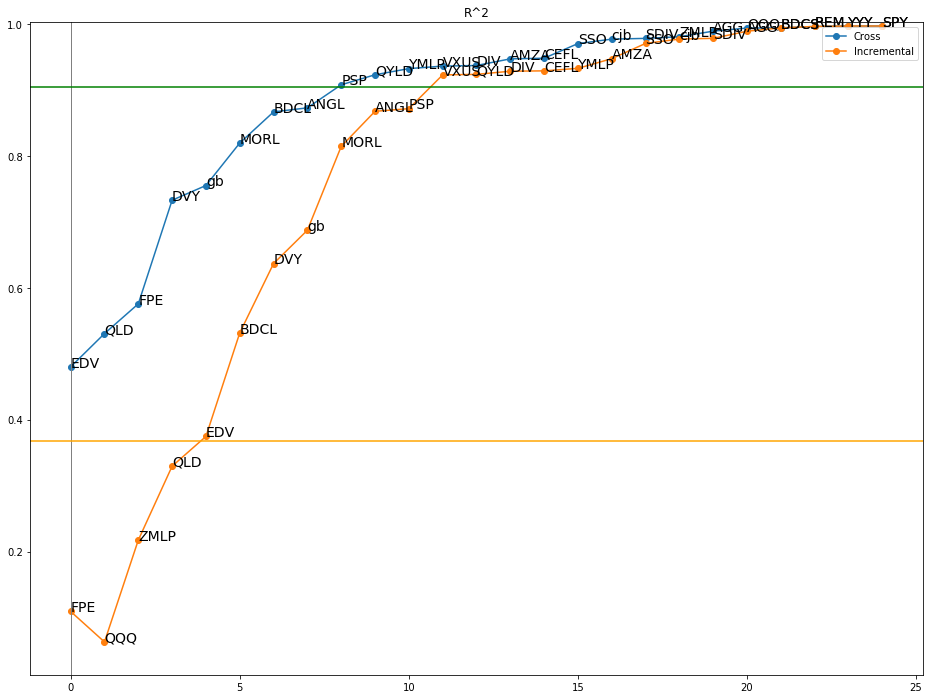

In [191]:
analyze_assets(*all, start=2015)

In [39]:
yld = lmap(getYield, all)
show(yld, range(0, 20, 1), ta=False, log=False)

In [6]:
# TICC, FSC
# TCAP - changed symbol name
bdc_comps = [ 'ABDC','ACSF','AINV','ARCC','BKCC','CPTA','CODI','EQS','FDUS','GARS','GLAD','GAIN','GBDC','GECC','HCAP','HTGC','HRZN','KCAP','MAIN','MCC','MRCC','MVC','NMFC','OFS','OHAI','OXLC','PFLT','PNNT','PSEC','SLRC','SUNS','SCM','CGBD','TCPC','TCRD','TSLX','TPVG','WHF']
all = get(bdc_comps, source="Y")

In [40]:
#show(getMedianSer(lmap(get_income, all)), ta=False, log=False)

In [8]:
#all = [x for x in all if x.shape[0]>0]
t = get("BDCS", mode="NTR")
all2 = get(all, trim=True, start=2005, mode="NTR")
pred = lrret(t, all2, return_pred=True, fit_values=True)

dropped: GAIN@Y, PFLT@Y, HTGC@Y, ABDC@Y, SUNS@Y, GECC@Y, KCAP@Y, TCRD@Y, MCC@Y, CGBD@Y, BKCC@Y, TPVG@Y, CODI@Y, HCAP@Y, FDUS@Y, OFS@Y, OXLC@Y, GBDC@Y, PNNT@Y, TCPC@Y, SLRC@Y, HRZN@Y, SCM@Y, ACSF@Y, MAIN@Y, MRCC@Y, TSLX@Y, CPTA@Y, NMFC@Y, WHF@Y, GARS@Y
trimmed data from 1992-09-11 [EQS@Y] to 2004-11-10 [OHAI@Y]


R^2: 0.9307007217277167
PSEC@Y   0.3556
AINV@Y   0.2654
ARCC@Y   0.2470
OHAI@Y   0.0578
MVC@Y    0.0363
GLAD@Y   0.0000
EQS@Y    0.0000
dtype: float64


trimmed data from 1990-01-02 [VFINX] to 2004-11-10 [BDCS - fit]


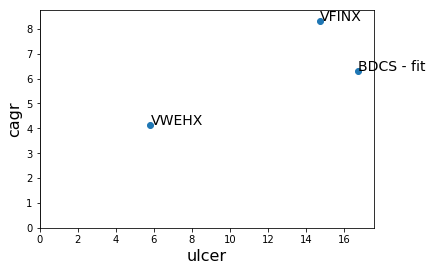

In [9]:
lst = get([pred, lc, cjb], mode="NTR")
show(lst, trim=True)
showRiskReturn(*lst)
show(lmap(dd, lst))
#show(BDCS)

In [33]:
lrret(BDCL, BDCS, freq="M", pos_weights=False, sum1=False, fit_values=True)

R^2: 0.981875104056143


BDCS   1.7352
dtype: float64

In [56]:
#all = get(["PSP", "BDCS", "BDCL", "MORL", "SPY", cjb, "SDIV", "DIV", "DVY"], trim=True, source="AV", start=2012)



dropped: ALTY, FPE
trimmed data from 1995-01-03 [VWEHX = cjb, SPY] to 2012-04-11 [ANGL]


In [98]:
# PSP is very similar to VXUS in price return
show(PSP/SPY, get("PSP", mode="PR")/get("SPY", mode="PR"), get("PSP", mode="PR")/get("VXUS", mode="PR"), PSP/VXUS, SPY)
show(get("PSP", mode="PR"), get("VXUS", mode="PR"))

trimmed data from 1995-01-03 [SPY] to 2011-01-28 [PSP / VXUS, PSP / VXUS]


trimmed data from 2006-10-24 [PSP] to 2011-01-28 [VXUS]
